# Image Processing Demo

## Demo Instructions:
1. Read in a color image in a standard format (e.g. jpg, png, etc) into an array (likely an X x Y x 3 array)
2. Plot the original image from the array format data.
3. For a portion of the image, show the array values and the associated clip of the image.
4. Display the color histograms for each of the 3 colors in the image, and display a summary bar plot showing the relative amounts of Red, Green, and Blue (or whatever 3 color palette is used).
5. Pick 3 images that, in a natural way, vary in the amount of red, green, and blue and plot the relative amounts of each color for each (e.g. a rose, a tree, a beach scene with lots of sky)

## *Solutions:*

## 1.  Read in a color image in a standard format (e.g. jpg, png, etc) into an array (likely an X x Y x 3 array)

We first need to install a new package called [biocLite]( https://www.bioconductor.org/install/), which is an open source software for bioinformatics.

**Note:** EBImage depends on a number of third-party packages, such as *tiff* and *fftwtools*. You might need to install these packages before installing EBImage. For example, if you are running R under OS X Sierra, you can install *fftwtools* with

In [11]:
install.packages("fftwtools", type="mac.binary.el-capitan")


The downloaded binary packages are in
	/var/folders/_9/z21d5kxj3bz537w89skwwl9w0000gn/T//RtmpSOVZxu/downloaded_packages


Or you can install the most recent version of R and RStudio and run the code in RStudio.

Run the following:

In [12]:
source("http://bioconductor.org/biocLite.R")
biocLite("EBImage")

Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install
BioC_mirror: https://bioconductor.org
Using Bioconductor 3.6 (BiocInstaller 1.28.0), R 3.4.3 (2017-11-30).
Installing package(s) ‘EBImage’
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Old packages: 'BH', 'bindr', 'bindrcpp', 'bit', 'blob', 'broom', 'callr',
  'caret', 'clipr', 'cluster', 'config', 'curl', 'CVST', 'data.table', 'DBI',
  'dbplyr', 'ddalpha', 'digest', 'dplyr', 'DRR', 'forcats', 'foreign',
  'ggplot2', 'glmnet', 'haven', 'hexbin', 'highr', 'hms', 'htmlwidgets',
  'httpuv', 'IRdisplay', 'kernlab', 'knitr', 'lava', 'lubridate', 'maps',
  'MASS', 'Matrix', 'mgcv', 'miniUI', 'modelr', 'mongolite', 'munsell', 'nlme',
  'odbc', 'openssl', 'packrat', 'pbdZMQ', 'pillar', 'plogr', 'prodlim',
  'profvis', 'psych', 'purrr', 'quantmod', 'randomForest', 'Rcpp'


If you are asked:

    Update all/some/none? [a/s/n].
    
Answer with "a"

Download the following image and put it in your working directory. https://en.wikipedia.org/wiki/Tabby_cat#/media/File:Cat_November_2010-1a.jpg

In [13]:
library("EBImage")
img2 <- readImage("Cat_November_2010-1a.jpg")

catarray <- img2@.Data
catarray[1:8,1:8,1]

0.6039216,0.6117647,0.6117647,0.6156863,0.6117647,0.6117647,0.6117647,0.6117647
0.6117647,0.6156863,0.6156863,0.6156863,0.6156863,0.6117647,0.6117647,0.6078431
0.6117647,0.6156863,0.6196078,0.6039216,0.6039216,0.6039216,0.6078431,0.6117647
0.6078431,0.6039216,0.6117647,0.6117647,0.6078431,0.6117647,0.6117647,0.6039216
0.6078431,0.6078431,0.6117647,0.6117647,0.6078431,0.6039216,0.6156863,0.6078431
0.6156863,0.6156863,0.6078431,0.6078431,0.6078431,0.6039216,0.6078431,0.6078431
0.6196078,0.6156863,0.6117647,0.6156863,0.6117647,0.6039216,0.6156863,0.6196078
0.6078431,0.6117647,0.6117647,0.6117647,0.6117647,0.6117647,0.6235294,0.6156863


Let’s take an in-depth look at the previous line: catarray[1:8,1:8,1]

The first dimension  1:8 picks the rows 1 through 8. The second dimension 1:8  picks the columns 1 through 8. This results in an 8x8 matrix of the first 8x8 pixels. The third dimension 1 selects the color red.

In [14]:
#This code performs similarly, except it selects the color green (note the 2 at the end instead of a 1 like before).
catarray[1:8,1:8,2]

0.6196078,0.6274510,0.6274510,0.6313725,0.6274510,0.6196078,0.6196078,0.6274510
0.6274510,0.6313725,0.6313725,0.6313725,0.6313725,0.6274510,0.6274510,0.6313725
0.6274510,0.6313725,0.6352941,0.6274510,0.6274510,0.6274510,0.6313725,0.6352941
0.6313725,0.6274510,0.6352941,0.6352941,0.6392157,0.6352941,0.6352941,0.6274510
0.6313725,0.6313725,0.6352941,0.6352941,0.6313725,0.6274510,0.6392157,0.6313725
0.6392157,0.6392157,0.6313725,0.6313725,0.6313725,0.6274510,0.6313725,0.6313725
0.6431373,0.6392157,0.6352941,0.6392157,0.6352941,0.6274510,0.6392157,0.6431373
0.6392157,0.6352941,0.6352941,0.6352941,0.6352941,0.6352941,0.6470588,0.6470588


In [15]:
#This code selects the color blue (note the 3 at the end instead of a 1 or 2). 
catarray[1:8,1:8,3]

0.6666667,0.6745098,0.6745098,0.6784314,0.6745098,0.6705882,0.6705882,0.6745098
0.6745098,0.6784314,0.6784314,0.6784314,0.6784314,0.6745098,0.6745098,0.6784314
0.6745098,0.6784314,0.6823529,0.6745098,0.6745098,0.6745098,0.6784314,0.6823529
0.6784314,0.6745098,0.6823529,0.6823529,0.6823529,0.6823529,0.6823529,0.6745098
0.6784314,0.6784314,0.6823529,0.6823529,0.6784314,0.6745098,0.6862745,0.6784314
0.6862745,0.6862745,0.6784314,0.6784314,0.6784314,0.6745098,0.6784314,0.6784314
0.6901961,0.6862745,0.6823529,0.6862745,0.6823529,0.6745098,0.6941176,0.6980392
0.6823529,0.6823529,0.6823529,0.6823529,0.6901961,0.6901961,0.7019608,0.6980392


## 2. Plot the original image from the array format data.

HTML widgets cannot be represented in plain text (need html)
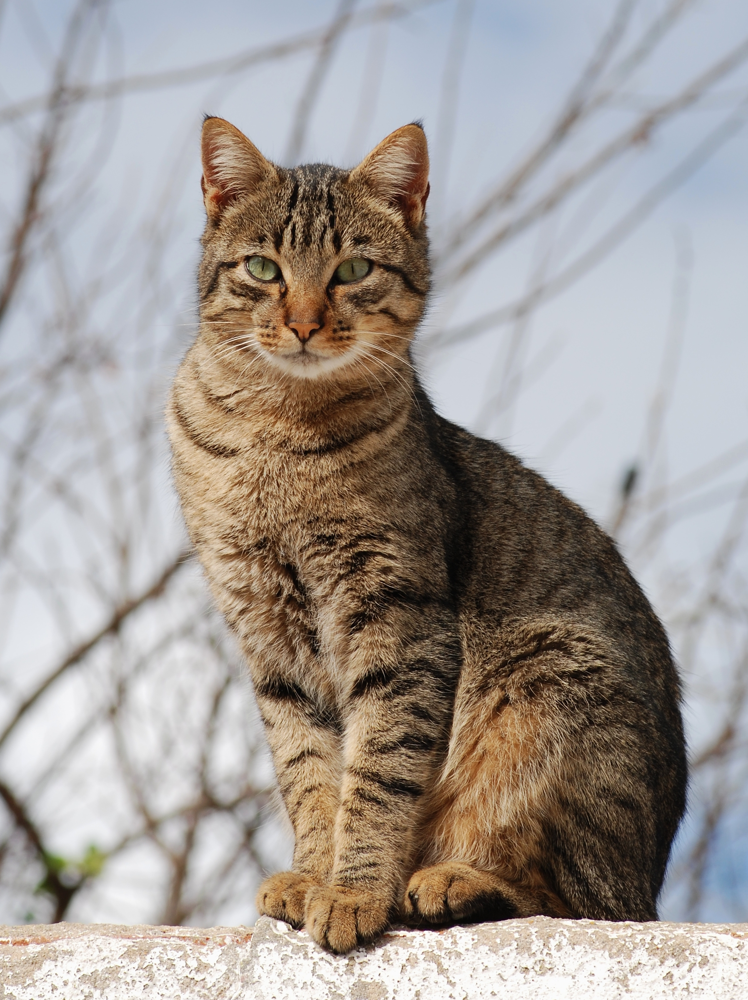

[1] 1795 2397    3

Image 
  colorMode    : Color 
  storage.mode : double 
  dim          : 1795 2397 3 
  frames.total : 3 
  frames.render: 1 

imageData(object)[1:5,1:6,1]
          [,1]      [,2]      [,3]      [,4]      [,5]      [,6]
[1,] 0.6039216 0.6117647 0.6117647 0.6156863 0.6117647 0.6117647
[2,] 0.6117647 0.6156863 0.6156863 0.6156863 0.6156863 0.6117647
[3,] 0.6117647 0.6156863 0.6196078 0.6039216 0.6039216 0.6039216
[4,] 0.6078431 0.6039216 0.6117647 0.6117647 0.6078431 0.6117647
[5,] 0.6078431 0.6078431 0.6117647 0.6117647 0.6078431 0.6039216


In [16]:
display(img2, method="browser")
dim(img2)
print(img2)

The display() function in R automatically plots arrays as an RGB image. You can see below that it takes in an argument of an object or array.


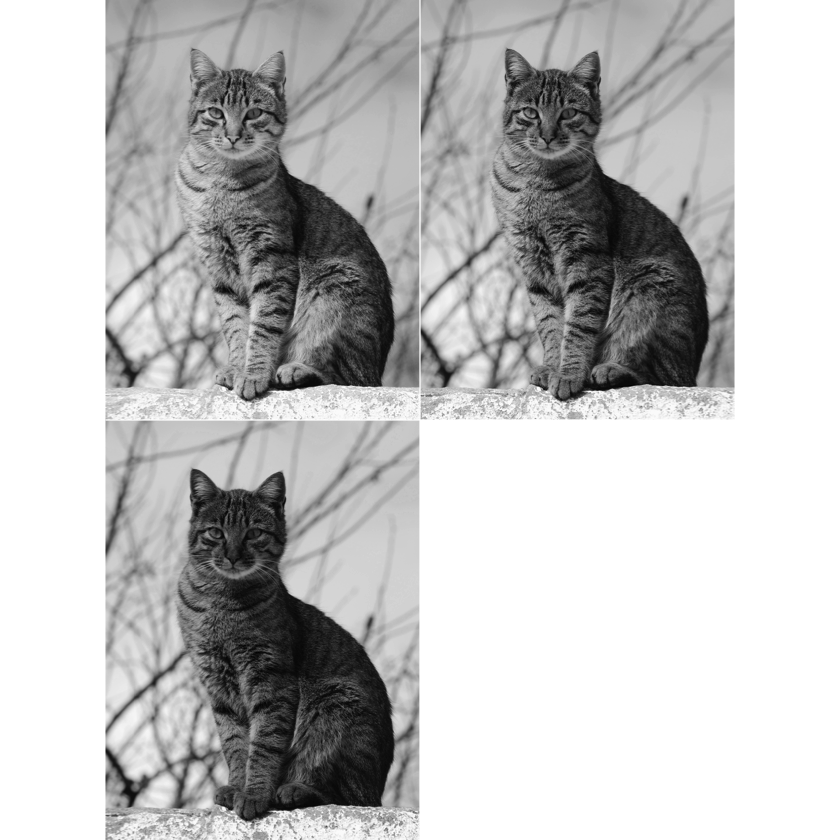

In [17]:
#We can also display the array. Type the following into your console.
display(catarray, all=TRUE)

This gives pixel intensity values for the array of our image. The first frame shows red intensity values, the second frame shows green intensity values, and the third frame shows blue intensity values. 

## 3. For a portion of the image, show the array values and the associated clip of the image.

Let’s perform this on two images, one large and one small. 


[1] 589 761   3

Image 
  colorMode    : Color 
  storage.mode : double 
  dim          : 589 761 3 
  frames.total : 3 
  frames.render: 1 

imageData(object)[1:5,1:6,1]
          [,1]      [,2]      [,3]      [,4]      [,5]      [,6]
[1,] 0.7725490 0.7764706 0.7803922 0.7764706 0.7803922 0.7803922
[2,] 0.7764706 0.7764706 0.7764706 0.7764706 0.7764706 0.7803922
[3,] 0.7764706 0.7764706 0.7803922 0.7803922 0.7764706 0.7764706
[4,] 0.7764706 0.7803922 0.7803922 0.7764706 0.7725490 0.7764706
[5,] 0.7803922 0.7803922 0.7764706 0.7764706 0.7764706 0.7803922


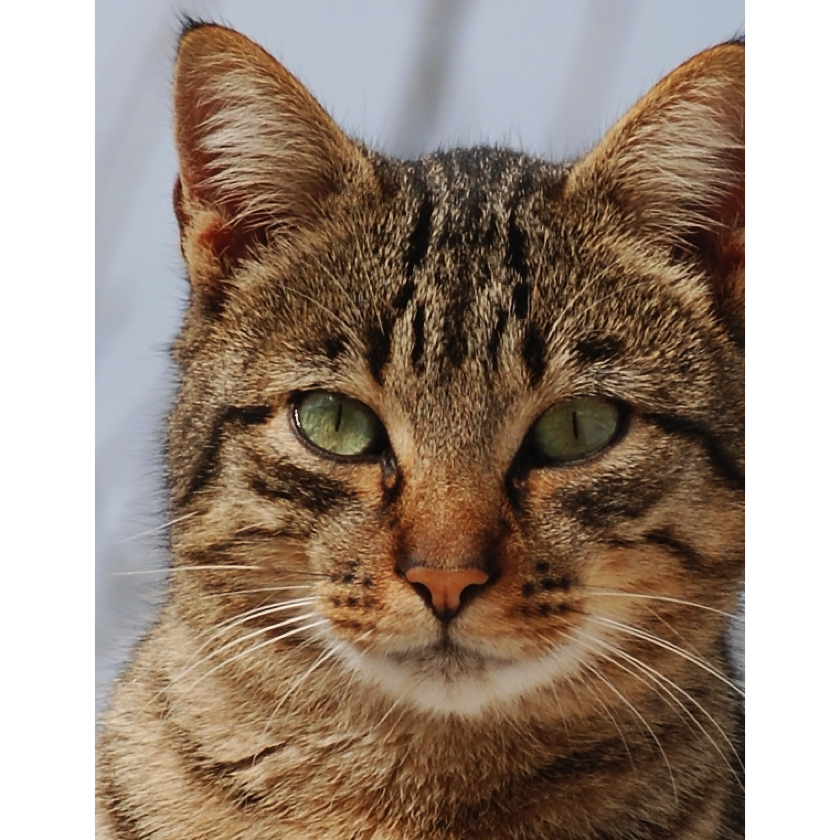

In [18]:
# A large cropped image
catface <- img2[412:1000, 260:1020, 1:3]
dim(catface) 
print(catface)
display(catface)

[1] 7 7 3

Image 
  colorMode    : Color 
  storage.mode : double 
  dim          : 7 7 3 
  frames.total : 3 
  frames.render: 1 

imageData(object)[1:5,1:6,1]
          [,1]      [,2]      [,3]      [,4]      [,5]      [,6]
[1,] 0.5176471 0.5058824 0.5803922 0.6000000 0.5568627 0.5176471
[2,] 0.5333333 0.5411765 0.5725490 0.5803922 0.5647059 0.5333333
[3,] 0.5568627 0.5568627 0.5529412 0.5529412 0.5647059 0.5607843
[4,] 0.5529412 0.5686275 0.5372549 0.5529412 0.5647059 0.5725490
[5,] 0.5529412 0.6078431 0.5764706 0.5568627 0.5490196 0.5647059


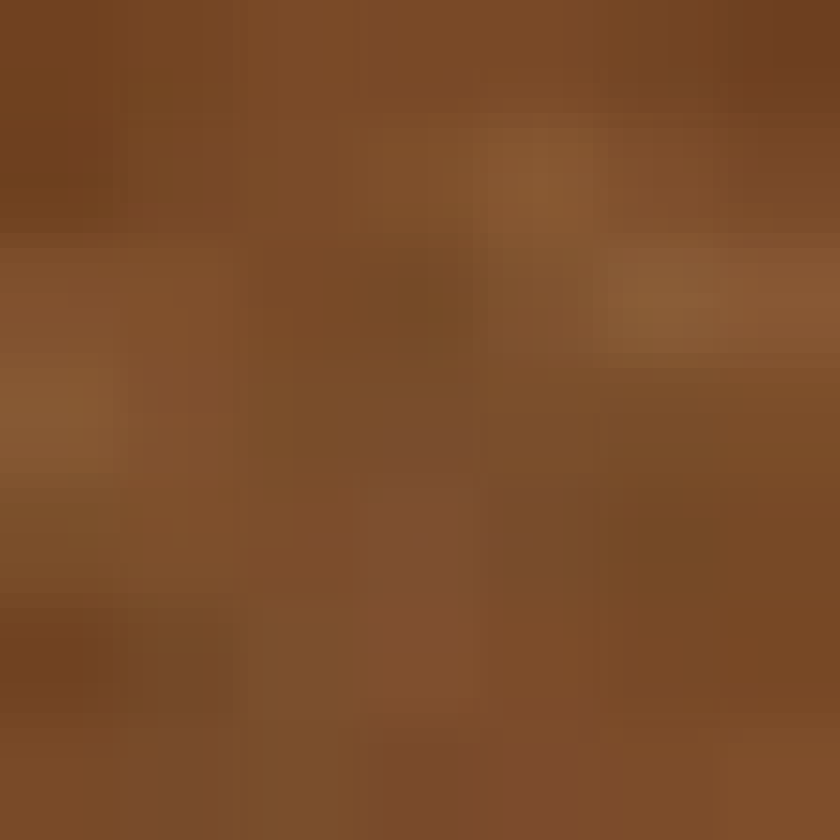

In [19]:
# A small cropped image
smallcrop <- img2[500:506, 300:306, 1:3]
dim(smallcrop) 
print(smallcrop)
display(smallcrop)

## 4. Display the color histograms for each of the 3 colors in the image, and display a summary bar plot showing the relative amounts of Red, Green, and Blue (or whatever 3 color palette is used).


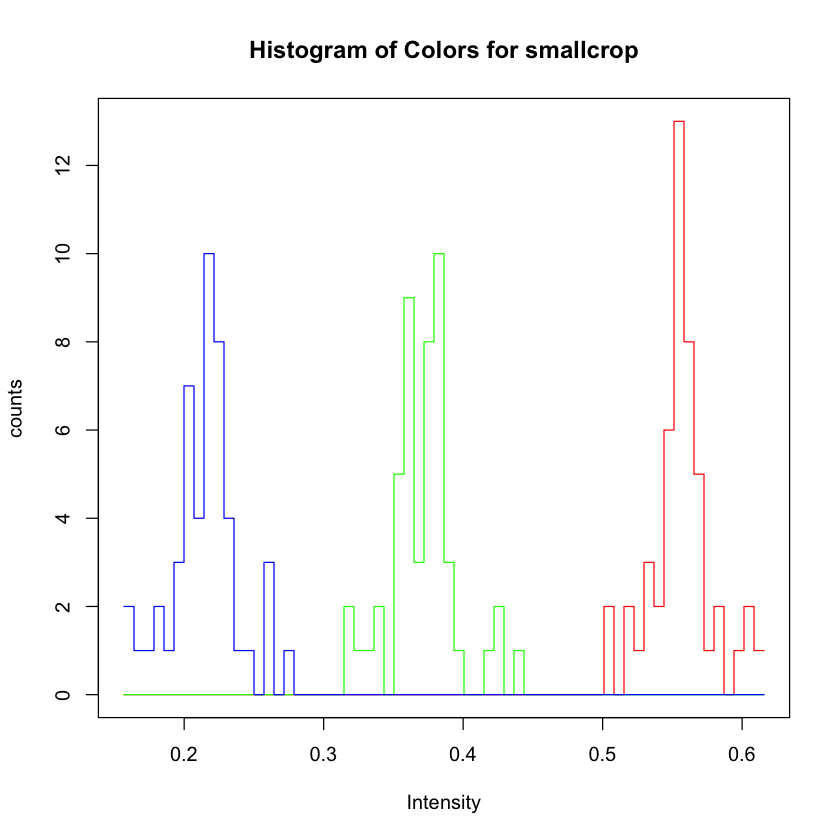

In [20]:
# Create histogram.
hist(smallcrop, main = paste("Histogram of Colors for smallcrop"))

In [21]:
# Create summary bar plot.
# catarray is an array of img2’s color intensity values
catarray <- img2@.Data
catarray[1:8,1:8,1]

0.6039216,0.6117647,0.6117647,0.6156863,0.6117647,0.6117647,0.6117647,0.6117647
0.6117647,0.6156863,0.6156863,0.6156863,0.6156863,0.6117647,0.6117647,0.6078431
0.6117647,0.6156863,0.6196078,0.6039216,0.6039216,0.6039216,0.6078431,0.6117647
0.6078431,0.6039216,0.6117647,0.6117647,0.6078431,0.6117647,0.6117647,0.6039216
0.6078431,0.6078431,0.6117647,0.6117647,0.6078431,0.6039216,0.6156863,0.6078431
0.6156863,0.6156863,0.6078431,0.6078431,0.6078431,0.6039216,0.6078431,0.6078431
0.6196078,0.6156863,0.6117647,0.6156863,0.6117647,0.6039216,0.6156863,0.6196078
0.6078431,0.6117647,0.6117647,0.6117647,0.6117647,0.6117647,0.6235294,0.6156863


In [22]:
# select red, green, and blue values by altering third dimension
red <- catarray[,,1]
gr <- catarray[,,2]
bl <- catarray[,,3]

# Take the average of the color intensity values 
avgred <- mean(red)
avggr <- mean(gr)
avgbl <- mean(bl)

Tibble is a modern take on data frames. Tibbles are simplified data frames that do not have more complicated and messy functions that data frames do. The function that creates these tibbles are called “tribbles”. Note the difference carefully.


In [23]:
# Import libraries.
library(ggplot2)
library(tibble)

bararray <- tribble(
  ~color,       ~average.intensity,
 "Red", avgred,
 "Green",   avggr,
 "Blue",  avgbl
)
bararray

color,average.intensity
Red,0.6345776
Green,0.6071330
Blue,0.5883213


bararray is an array that contains the bar plot data. The ~ indicates a header, which is the name of a column. The color values “Red”, “Green”, “Blue” indicate the x values of each bar. The average.intensity values avgred, avggr, avgbl indicate the y value/height of each bar.  


Warning message in plyr::split_indices(scale_id, n):
“'.Random.seed' is not an integer vector but of type 'NULL', so ignored”

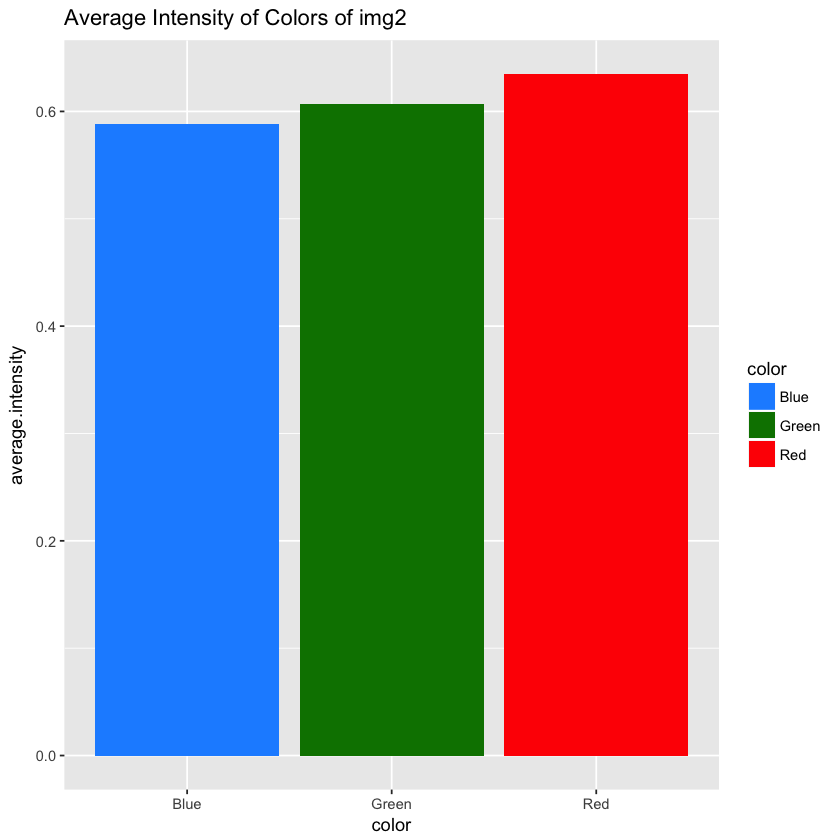

In [24]:
# Create bar plot.

bplot <- ggplot(data = bararray) + 
geom_bar(mapping = aes(x = color, y = average.intensity, fill = color), stat="identity") + 
ggtitle("Average Intensity of Colors of img2")+ scale_fill_manual(values = c("#1E90FF", "#008000", "#FF0000"))
bplot


Note that "#1E90FF", "#008000", "#FF0000" are hexadecimal representations of green, blue, and red. 


## 5. Pick 3 images that, in a natural way, vary in the amount of red, green, and blue and plot the relative amounts of each color for each (e.g. a rose, a tree, a beach scene with lots of sky)

Download these example images in your current directory:
Rose: https://simple.wikipedia.org/wiki/Rose#/media/File:Rose_rouge.JPG
Fern: https://commons.wikimedia.org/wiki/File:Sa-fern.jpg
Sky:
https://eoimages.gsfc.nasa.gov/images/imagerecords/84000/84487/contrails_pho_2014127.jpg


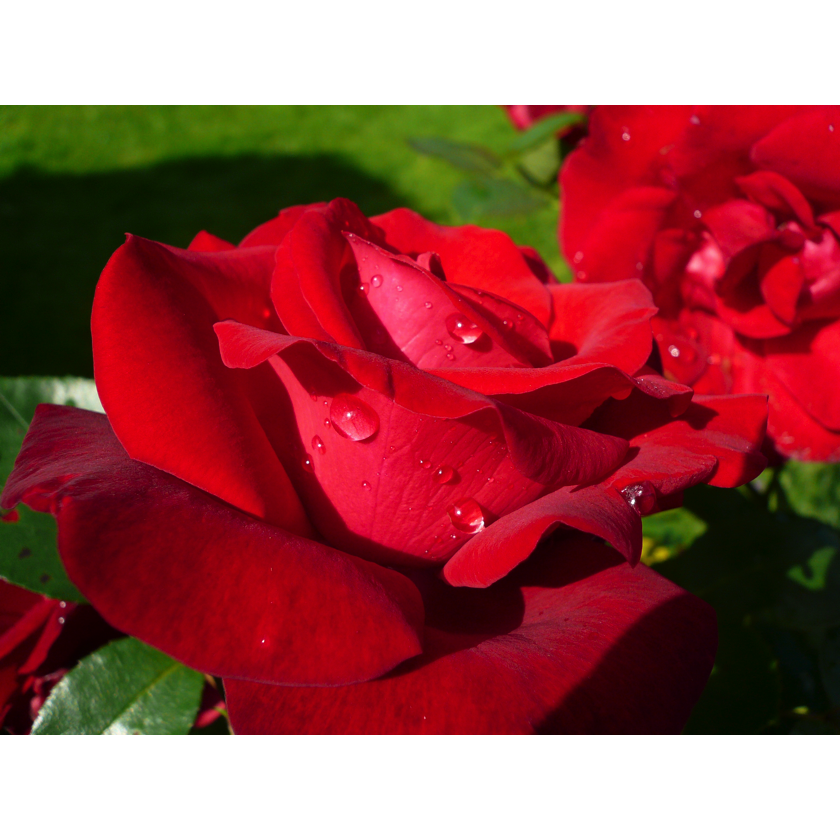

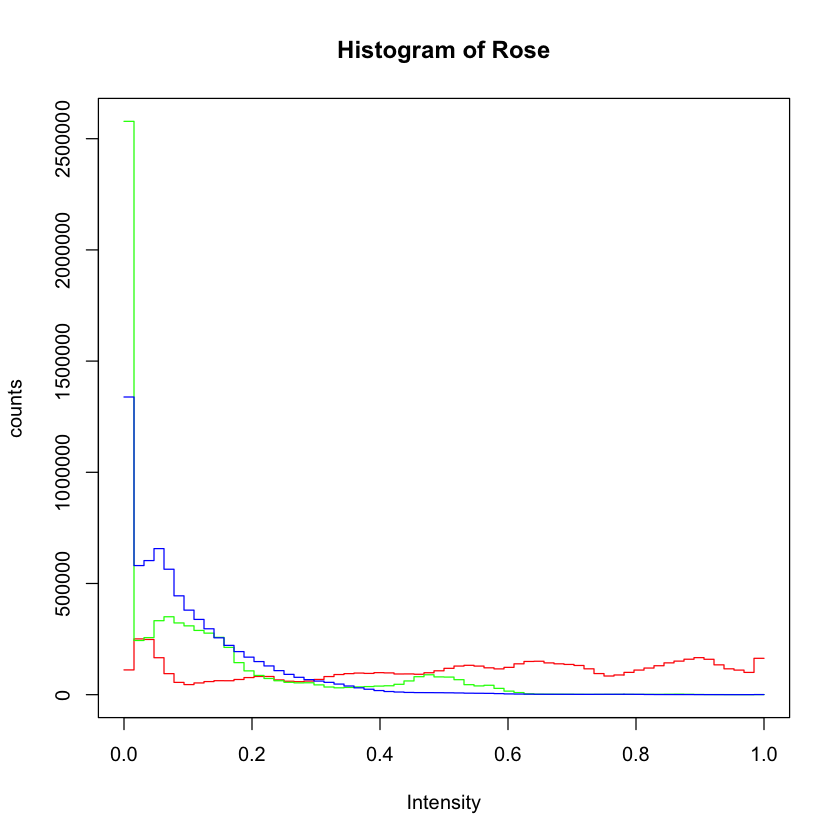

In [25]:
# Plot a mostly red image
rose <- readImage("Rose_rouge.JPG")
display(rose)
hist(rose, main=paste("Histogram of Rose"))

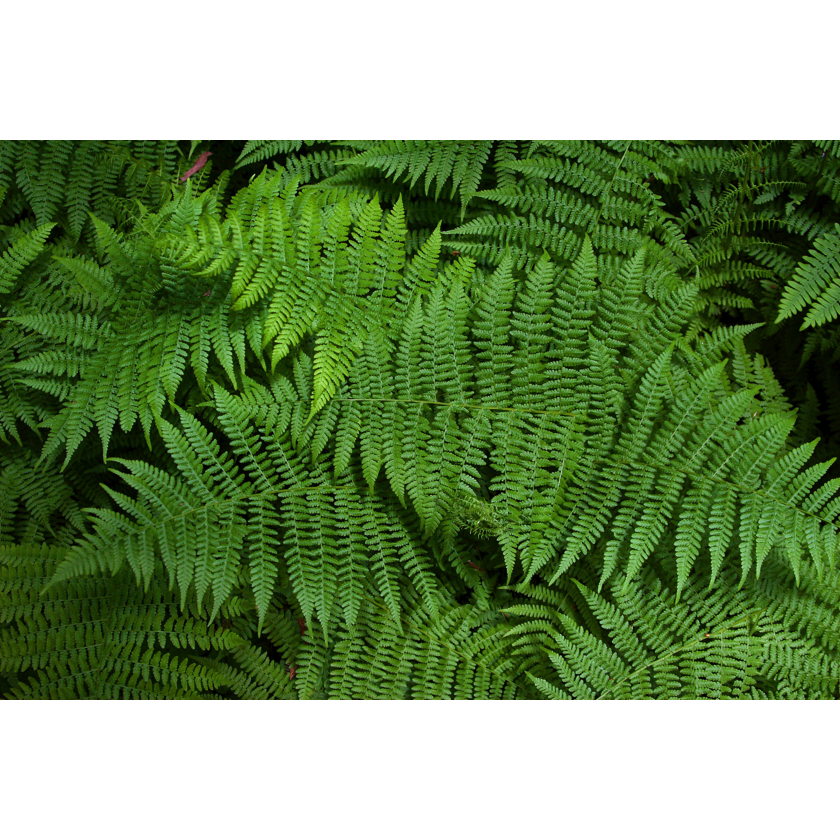

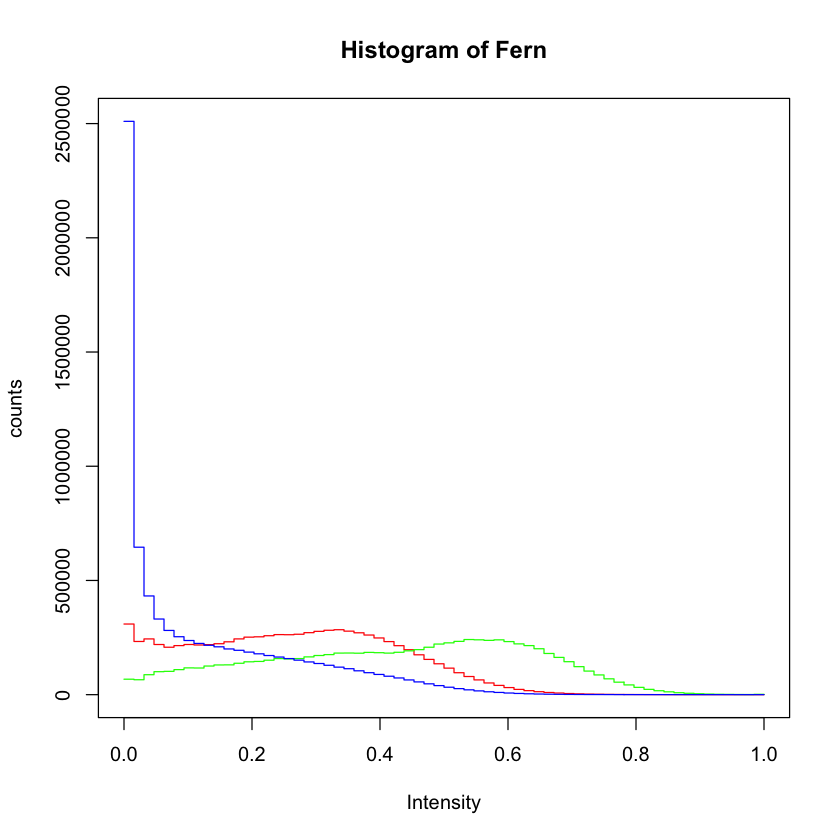

In [26]:
# Plot a mostly green image
fern <- readImage("Sa-fern.jpg")
display(fern)
hist(fern, main=paste("Histogram of Fern"))

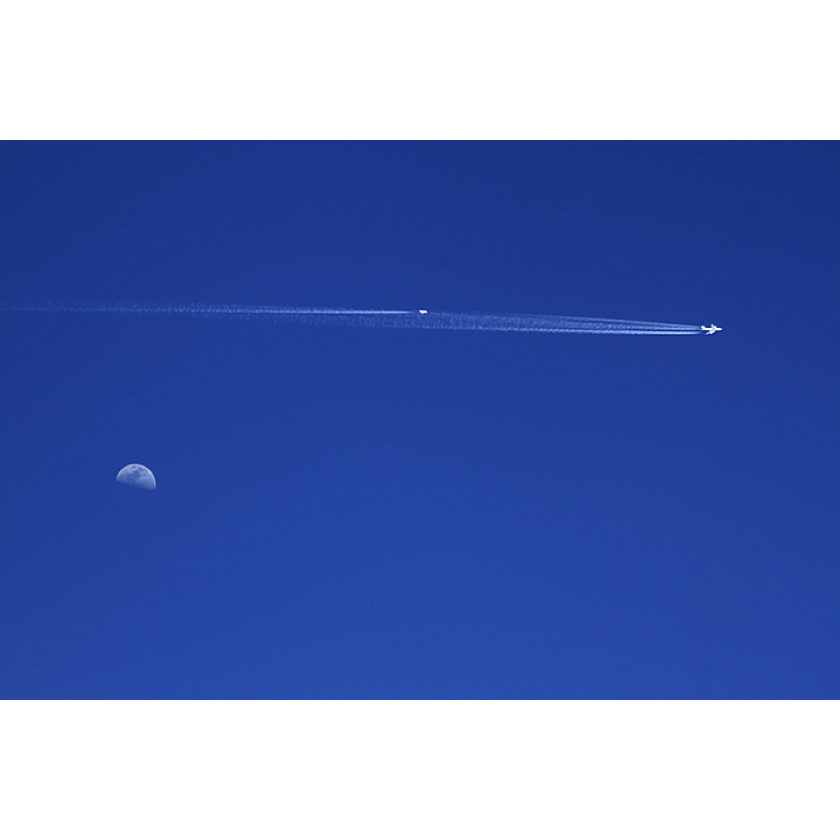

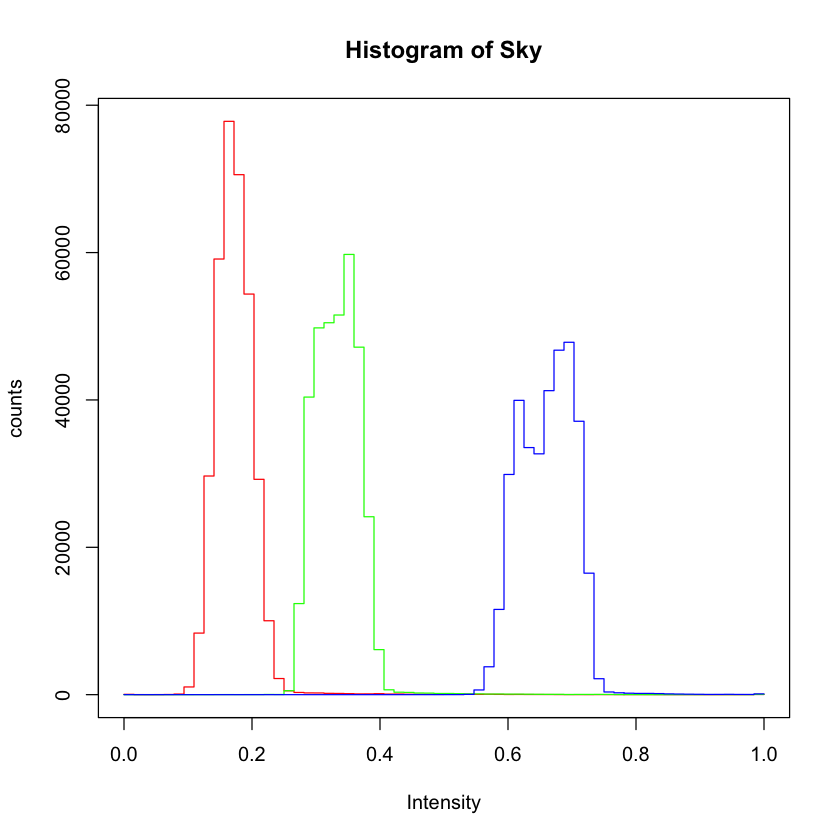

In [27]:
# Plot a mostly Blue
sky <- readImage("contrails_pho_2014127.jpg")
display(sky)
hist(sky, main=paste("Histogram of Sky"))

If you look at the histogram of the sky, you can see that there are many different colors within the same sky image. You might be wondering as to why that is.


Here’s why we see blue when we look at the sky. The sun emits light at many different wavelengths. When all of those wavelengths are combined, the light looks white. Red light has a longer wavelength. Blue light has a shorter wavelength. Green is in between. When red light hits air particles, it does not bounce; it essentially goes straight through the air. When blue light hits air particles, it does bounce; it bounces in all directions. This is why you see the sky as blue. Blue light is coming from all directions, while red light is only visible on the line of sight that connects the sun to you. 

![alt text](https://www.sciencemadesimple.com/img_sky/horiz.jpg) 
![alt text](https://s3mn.mnimgs.com/img/shared/discuss_editlive/2191102/2012_02_01_02_08_04/earth_3793810947736428225.png) 